<a href="https://www.kaggle.com/code/yugeshverma/siim-acr-pneumothorax-test?scriptVersionId=148529265" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
from glob import glob
import os
import pandas as pd
import pydicom
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from matplotlib import cm, pyplot as plt
import plotly.express as px
import glob, cv2, gzip, tqdm

data_dir = "../input/siim-acr-pneumothorax-segmentation-data"
#checnking the input files
print(os.listdir(data_dir))

['dicom-images-test', 'train-rle.csv', 'dicom-images-train', 'pneumothorax']


In [2]:
#import torch

# Check if a GPU is available
#if torch.cuda.is_available():
#    print("GPU is available and enabled.")
#else:
#    print("GPU is not available. Make sure you've selected the GPU accelerator.")


# Data Exploration and Analysis 

### Reading 'train-rle.csv' File

In [3]:
train_rle = pd.read_csv(data_dir + '/train-rle.csv', delimiter="," )

print(train_rle.describe())
train_rle.head()

                                                  ImageId  EncodedPixels
count                                               11582          11582
unique                                              10675           3287
top     1.2.276.0.7230010.3.1.4.8323329.1851.151787516...             -1
freq                                                   10           8296


,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.5597.151787518...,-1
1,1.2.276.0.7230010.3.1.4.8323329.12515.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.4904.151787518...,175349 7 1013 12 1009 17 1005 19 1003 20 1002...
3,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,407576 2 1021 7 1015 10 1013 12 1011 14 1008 ...
4,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 1...


If a value is not equal to -1 in EncodedPixels, it indicates that pneumothorax is present, and the value provides information about the location and shape of the pneumothorax mask.

In [4]:
train_rle[' EncodedPixels'] = train_rle[' EncodedPixels'].str.strip()
print("Count of instances with no pneumothorax: ", (train_rle[' EncodedPixels'] == '-1').sum())
print("Count of instances with pneumothorax: ", (train_rle[' EncodedPixels'] != '-1').sum())

Count of instances with no pneumothorax:  8296
Count of instances with pneumothorax:  3286


### Collecting DICOM Image Paths

In [5]:
import glob
train = sorted(glob.glob("../input/siim-acr-pneumothorax-segmentation-data/pneumothorax/dicom-images-train/*/*/*.dcm"))
test = sorted(glob.glob("../input/siim-acr-pneumothorax-segmentation-data/pneumothorax/dicom-images-test/*/*/*.dcm"))
print("train DICOM files: ", len(train))
print("test DICOM files: ", len(test))

train DICOM files:  10712
test DICOM files:  1377


### Reading a DICOM Image

DICOM images are more than just the pixel data; they also include metadata like patient information, study details, and information about the imaging equipment used.

In [6]:
data = pydicom.dcmread(test[5])
print(data)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.5801.1517875190.850480
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.5801.1517875190.850480
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time        

In [7]:
data = pydicom.dcmread(train[5])
print(data)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.10004.1517875220.929537
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.10004.1517875220.929537
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

### Displaying a DICOM Image

#### Displaying a DICOM Image
1. test image
2. train image

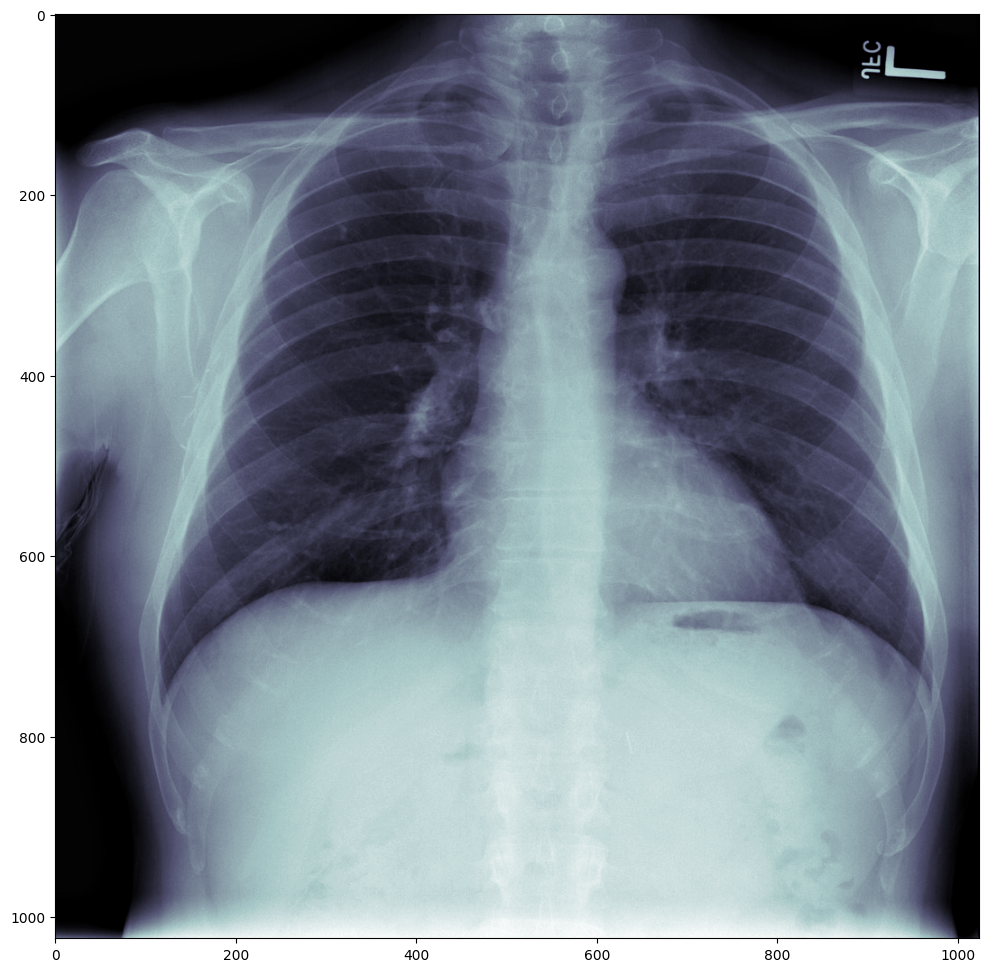

In [8]:
imagedata= pydicom.dcmread(test[5])
plt.figure(figsize=(12, 12))
plt.imshow(imagedata.pixel_array, cmap=plt.cm.bone)
plt.show()

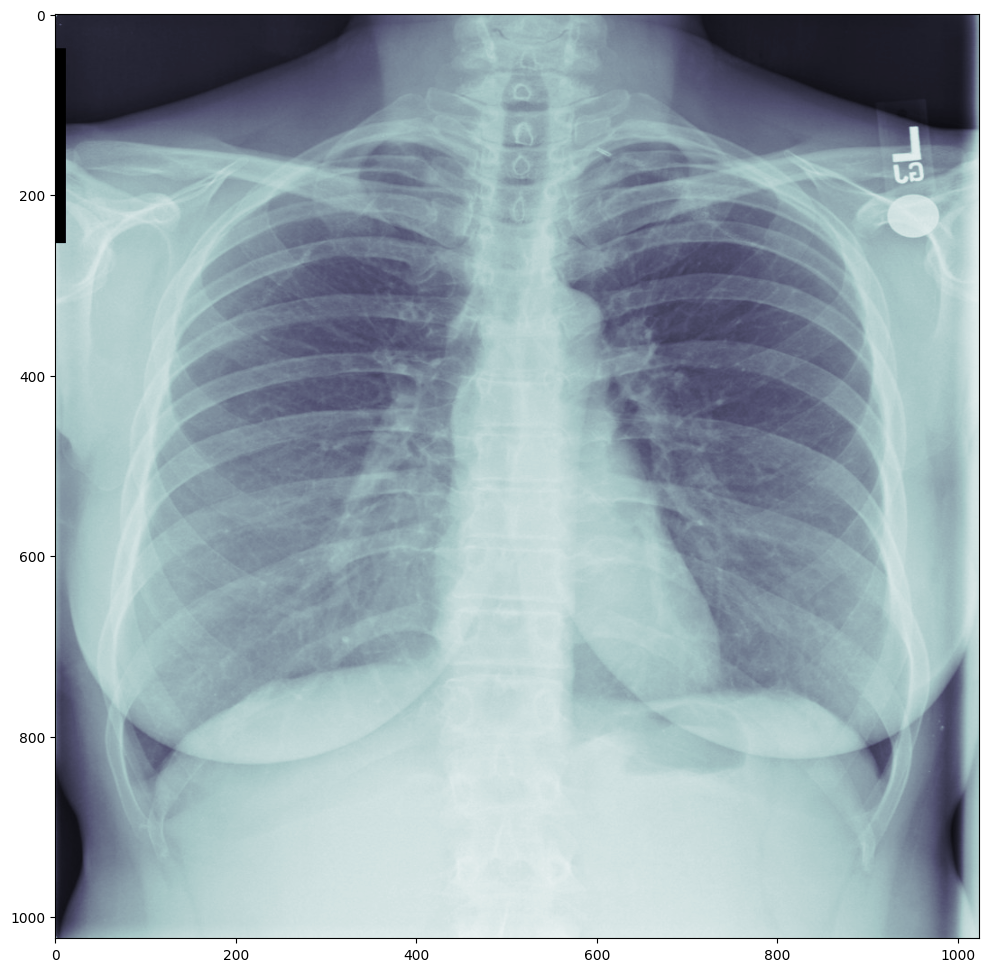

In [9]:
imagedata= pydicom.dcmread(train[5])
plt.figure(figsize=(12, 12))
plt.imshow(imagedata.pixel_array, cmap=plt.cm.bone)
plt.show()

#### Displaying Multiple DICOM Images

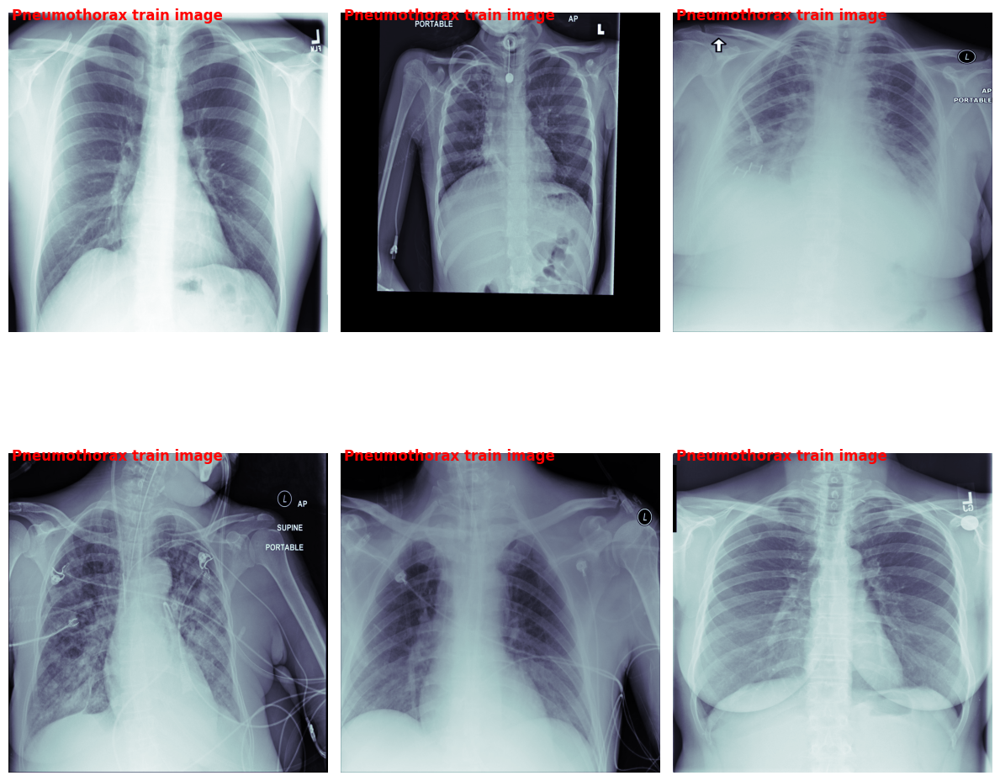

In [10]:
from matplotlib import cm, pyplot as plt

selected_files = train[:6]

rows = 2
cols = 3

fig, axs = plt.subplots(rows, cols, figsize=(12, 12))

# Loop through the selected files and display them in subplots
for i, file_path in enumerate(selected_files):
    row = i // cols
    col = i % cols
    
    imagedata = pydicom.dcmread(file_path)
    
    axs[row, col].imshow(imagedata.pixel_array, cmap=plt.cm.bone)
    axs[row, col].axis('off')
    axs[row, col].text(10, 20, 'Pneumothorax train image', fontsize=12, color='red', fontweight='bold')


plt.tight_layout()
plt.show()


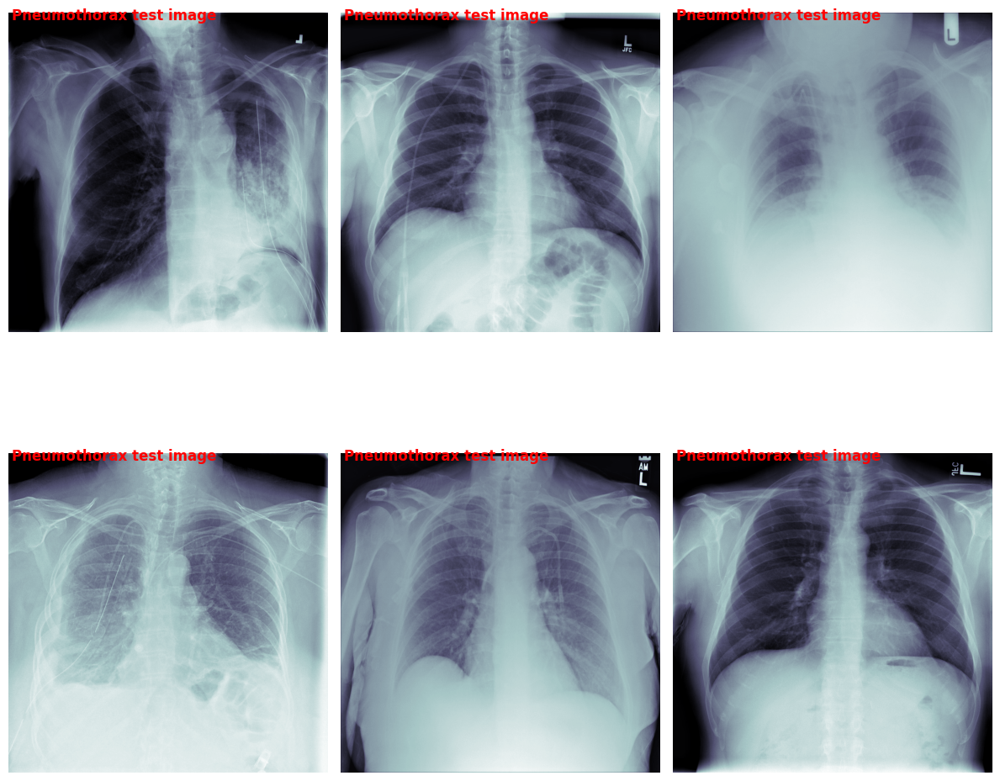

In [11]:
from matplotlib import cm, pyplot as plt

selected_files = test[:6]

rows = 2
cols = 3

fig, axs = plt.subplots(rows, cols, figsize=(12, 12))

# Loop through the selected files and display them in subplots
for i, file_path in enumerate(selected_files):
    row = i // cols
    col = i % cols
    
    imagedata = pydicom.dcmread(file_path)
    
    axs[row, col].imshow(imagedata.pixel_array, cmap=plt.cm.bone)
    axs[row, col].axis('off')
    axs[row, col].text(10, 20, 'Pneumothorax test image', fontsize=12, color='red', fontweight='bold')

plt.tight_layout()
plt.show()


#### Displaying DICOM Images with Pneumothorax Labels

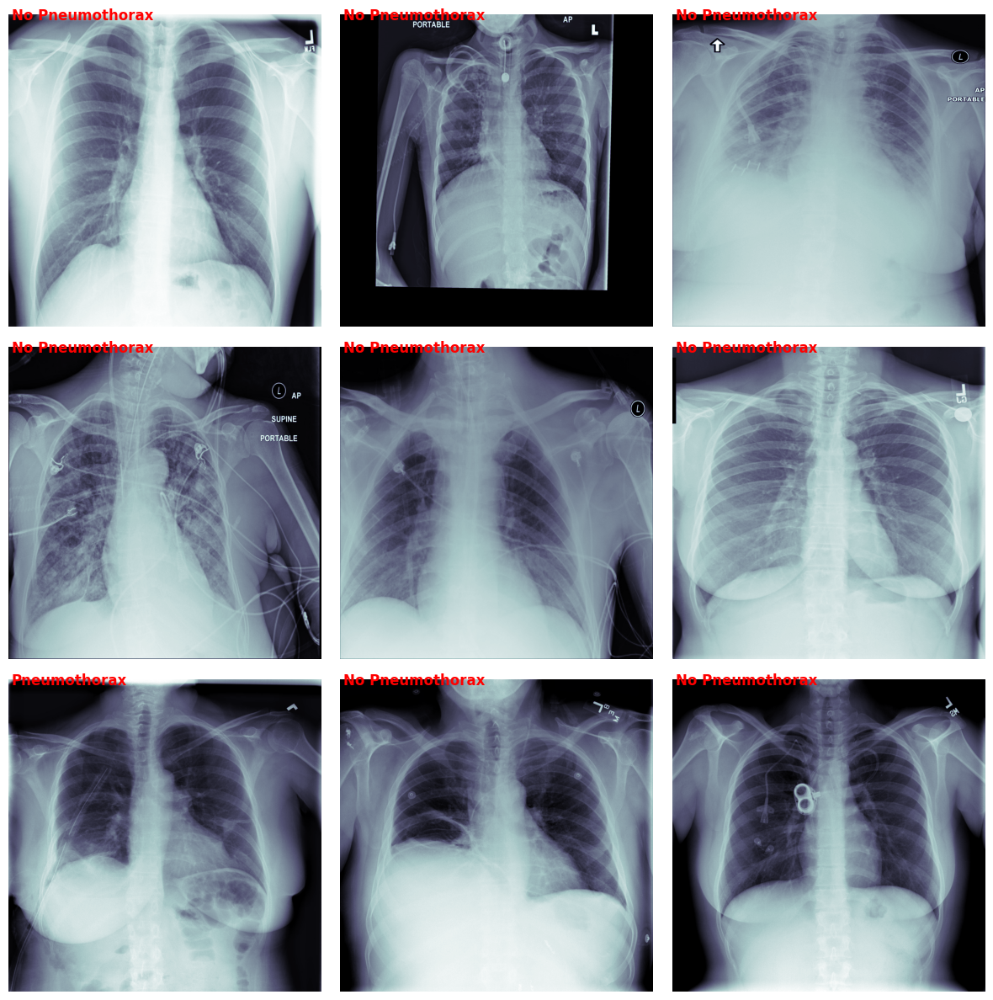

In [12]:
selected_files = train[:9]

# Create a 3x3 grid to display the images
rows = 3
cols = 3

# Create a figure and a set of subplots
fig, axs = plt.subplots(rows, cols, figsize=(12, 12))

# Loop through the selected files and display them in subplots
for i, file_path in enumerate(selected_files):
    row = i // cols
    col = i % cols

    # Read the DICOM image
    imagedata = pydicom.dcmread(file_path)

    # Display the image in the current subplot
    axs[row, col].imshow(imagedata.pixel_array, cmap=plt.cm.bone)
    axs[row, col].axis('off')

    # Get the corresponding row from the CSV for the current image
    image_id = os.path.splitext(os.path.basename(file_path))[0]
    df_row = train_rle[train_rle['ImageId'] == image_id]

    # Check if pneumothorax is present (non-'-1' encoding)
    encoding = df_row.iloc[0][' EncodedPixels']
    if encoding != '-1':
        # If pneumothorax is present, add a label to the image
        axs[row, col].text(10, 20, 'Pneumothorax', fontsize=12, color='red', fontweight='bold')
    else:
        # If pneumothorax is not present, add a label to the image
        axs[row, col].text(10, 20, 'No Pneumothorax', fontsize=12, color='red', fontweight='bold')
            

# Ensure that the layout is tight and show the figure
plt.tight_layout()
plt.show()

In [13]:
train_rle

,ImageId,EncodedPixels
0,1.2.276.0.7230010.3.1.4.8323329.5597.151787518...,-1
1,1.2.276.0.7230010.3.1.4.8323329.12515.15178752...,-1
2,1.2.276.0.7230010.3.1.4.8323329.4904.151787518...,175349 7 1013 12 1009 17 1005 19 1003 20 1002 ...
3,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,407576 2 1021 7 1015 10 1013 12 1011 14 1008 1...
4,1.2.276.0.7230010.3.1.4.8323329.32579.15178751...,252069 1 1021 3 1020 4 1018 5 1018 6 1016 7 10...
...,...,...
11577,1.2.276.0.7230010.3.1.4.8323329.4461.151787518...,592067 6 1016 10 1012 14 1007 18 1004 20 1003 ...
11578,1.2.276.0.7230010.3.1.4.8323329.4461.151787518...,610576 3 1001 38 981 53 966 63 956 73 947 87 9...
11579,1.2.276.0.7230010.3.1.4.8323329.32730.15178751...,-1
11580,1.2.276.0.7230010.3.1.4.8323329.13252.15178752...,-1


In [14]:

HasPneumothorax = [train_rle[' EncodedPixels'] != '-1']


### Extracting Patient Attributes from DICOM Metadata

In [15]:
# Create an empty list to store patient-related attributes
patients = []

# Function to extract patient attributes from Dicom metadata
def extract_patient_attributes(dicom_file_path):
    dicom_data = pydicom.dcmread(dicom_file_path)
    patient = {
        "UID": dicom_data.SOPInstanceUID,
        "Age": dicom_data.PatientAge,
        "Sex": dicom_data.PatientSex,
        "Modality": dicom_data.Modality,
        "BodyPart": dicom_data.BodyPartExamined,
        "ViewPosition": dicom_data.ViewPosition,
        "Path": dicom_file_path
    }
    return patient
train_dir = '/kaggle/input/siim-acr-pneumothorax-segmentation-data/pneumothorax/dicom-images-train'
# Iterate through the DICOM images in the train folder
for root, _, files in os.walk(train_dir):
    for file in files:
        dicom_file_path = os.path.join(root, file)
        patient = extract_patient_attributes(dicom_file_path)
        patients.append(patient)
# Create a DataFrame from the list of patient attributes
df_patients = pd.DataFrame(patients, columns=["UID", "Age", "Sex", "Modality", "BodyPart", "ViewPosition", "Path"])

pneumothorax_info = train_rle.copy()
pneumothorax_info['HasPneumothorax'] = pneumothorax_info[' EncodedPixels'] != '-1'
#pneumothorax_info.drop(' EncodedPixels',  axis=1, inplace =True)
df_patients = pd.merge(df_patients, pneumothorax_info, left_on="UID", right_on="ImageId", how="left")


# Display the DataFrame
df_patients.head()


,UID,Age,Sex,Modality,BodyPart,ViewPosition,Path,ImageId,EncodedPixels,HasPneumothorax
0,1.2.276.0.7230010.3.1.4.8323329.2057.151787517...,54,M,CR,CHEST,PA,/kaggle/input/siim-acr-pneumothorax-segmentati...,1.2.276.0.7230010.3.1.4.8323329.2057.151787517...,-1,False
1,1.2.276.0.7230010.3.1.4.8323329.11919.15178752...,82,F,CR,CHEST,AP,/kaggle/input/siim-acr-pneumothorax-segmentati...,1.2.276.0.7230010.3.1.4.8323329.11919.15178752...,-1,False
2,1.2.276.0.7230010.3.1.4.8323329.12935.15178752...,38,F,CR,CHEST,PA,/kaggle/input/siim-acr-pneumothorax-segmentati...,1.2.276.0.7230010.3.1.4.8323329.12935.15178752...,-1,False
3,1.2.276.0.7230010.3.1.4.8323329.14254.15178752...,43,M,CR,CHEST,PA,/kaggle/input/siim-acr-pneumothorax-segmentati...,1.2.276.0.7230010.3.1.4.8323329.14254.15178752...,-1,False
4,1.2.276.0.7230010.3.1.4.8323329.3796.151787517...,51,F,CR,CHEST,AP,/kaggle/input/siim-acr-pneumothorax-segmentati...,1.2.276.0.7230010.3.1.4.8323329.3796.151787517...,-1,False


In [16]:
df_patients.describe()

,UID,Age,Sex,Modality,BodyPart,ViewPosition,Path,ImageId,EncodedPixels,HasPneumothorax
count,11619,11619,11619,11619,11619,11619,11619,11582,11582,11582
unique,10712,93,2,1,1,2,10712,10675,3287,2
top,1.2.276.0.7230010.3.1.4.8323329.1851.151787516...,58,M,CR,CHEST,PA,/kaggle/input/siim-acr-pneumothorax-segmentati...,1.2.276.0.7230010.3.1.4.8323329.1851.151787516...,-1,False
freq,10,352,6444,11619,11619,7117,10,10,8296,8296


In [17]:
null_sum = df_patients.isnull().sum()
print(null_sum)

UID                 0
Age                 0
Sex                 0
Modality            0
BodyPart            0
ViewPosition        0
Path                0
ImageId            37
 EncodedPixels     37
HasPneumothorax    37
dtype: int64


In [18]:
df_patients = df_patients.dropna()
df_patients.isnull().sum()

UID                0
Age                0
Sex                0
Modality           0
BodyPart           0
ViewPosition       0
Path               0
ImageId            0
 EncodedPixels     0
HasPneumothorax    0
dtype: int64

#### Visualizing Gender Distribution

In [19]:
# Create subplots for pie charts
fig = go.Figure()

# Pie chart for gender distribution
gender_counts = df_patients["Sex"].value_counts()
fig.add_trace(go.Pie(
    labels=gender_counts.index,
    values=gender_counts.values,
    #title="Gender Distribution",
    
))
fig.update_layout(title="Gender distribution")
fig.show()


#### Visualizing Pneumothorax Distribution

In [20]:
# Pie chart for gender distribution with pneumothorax
pneumothorax_counts = df_patients["HasPneumothorax"].value_counts()
fig1 = go.Figure()
fig1.add_trace(go.Pie(
    labels=pneumothorax_counts.index,
    values=pneumothorax_counts.values,
    #title="Pneumothorax distribution",
))
fig1.update_layout(title="Pneumothorax distribution")
fig1.show()


#### Visualizing View Position Distribution

In [21]:

view_position_counts = df_patients["ViewPosition"].value_counts()
fig2 = go.Figure()
fig2.add_trace(go.Pie(
    labels=view_position_counts.index,
    values=view_position_counts.values,
    #name="View Position Distribution",
))

# Update layout
fig2.update_layout(title="View Position Distribution")

# Show the figure
fig2.show()

#### Visualizing Gender and Pneumothorax Status

In [22]:
gender_pneumothorax_counts = df_patients.groupby(['Sex', 'HasPneumothorax']).size().unstack(fill_value=0)

# Create a bar chart using Plotly Express
fig = px.bar(
    gender_pneumothorax_counts,
    x=gender_pneumothorax_counts.index,
    y=[False, True],
    labels={"Sex": "Gender", "HasPneumothorax": "Pneumothorax Status"},
    title="Count of Men and Women with Pneumothorax Status",
)

# Show the figure
fig.show()

#### Visualizing View Positions by Gender

In [23]:
view_gender_counts = df_patients.groupby(['ViewPosition', 'Sex']).size().unstack(fill_value=0)

# Create a bar chart using Plotly Express
fig = px.bar(
    view_gender_counts,
    x=view_gender_counts.index,
    y=['M', 'F'],
    labels={"ViewPosition": "View Position", "Sex": "Gender"},
    title="Count of View Positions by Gender",
)

# Show the figure
fig.show()

#### Visualizing View Positions with Pneumothorax Status

In [24]:
view_pneumothorax_counts = df_patients.groupby(['ViewPosition', 'HasPneumothorax']).size().unstack(fill_value=0)

# Create a bar chart using Plotly Express
fig = px.bar(
    view_pneumothorax_counts,
    x=view_pneumothorax_counts.index,
    y=[False, True],
    labels={"ViewPosition": "View Position", "HasPneumothorax": "Pneumothorax Status"},
    title="Count of View Positions with Pneumothorax Status",
)

# Show the figure
fig.show()

#### Visualizing Age Distribution by Gender

In [25]:
# Create separate histograms for male and female patients
fig = px.histogram(
    df_patients,
    x='Age',
    color='Sex',
    marginal='box',  # Display box plots on top of histograms
    title='Age Distribution by Gender',
    labels={'Age': 'Age', 'Sex': 'Gender'},
)

# Show the figure
fig.show()

#### Visualizing Age Distribution and Pneumothorax Status

In [26]:
df_patients = df_patients.sort_values(by="Age")
fig = px.histogram(df_patients, x="Age", title="Age Distribution",color="HasPneumothorax", pattern_shape="Sex", marginal='box')
#fig.update_xaxes(categoryorder='total ascending')
# Show the figure
fig.show()

#### Visualizing Pneumothorax Distribution by Gender and View Position

In [27]:
# Create a 'HasPneumothorax' column based on the 'EncodedPixels' column
#df_patients['HasPneumothorax'] = df_patients[' EncodedPixels'] != ' -1'

# Group the data by gender
grouped = df_patients.groupby('Sex')

# Create a separate bar chart for each gender
figures = []

for gender, group in grouped:
    pneumothorax_counts = group.groupby(['ViewPosition', 'HasPneumothorax']).size().unstack(fill_value=0)

    fig = go.Figure()

    for pneumothorax_status in pneumothorax_counts.columns:
        data = pneumothorax_counts[pneumothorax_status]
        fig.add_trace(go.Bar(
            x=data.index,
            y=data,
            name=f'Pneumothorax: {pneumothorax_status}',
        ))

    fig.update_layout(
        barmode='group',
        title=f'Pneumothorax Distribution for Gender: {gender}',
        xaxis_title='View Position',
        yaxis_title='Count',
    )

    figures.append(fig)

# Show the figures
for fig in figures:
    fig.show()


### RLE (Run-Length Encoding) Conversion Functions

In [28]:
import numpy as np

def mask2rle(img, width, height):
    rle = []
    lastColor = 0;
    currentPixel = 0;
    runStart = -1;
    runLength = 0;

    for x in range(width):
        for y in range(height):
            currentColor = img[x][y]
            if currentColor != lastColor:
                if currentColor == 255:
                    runStart = currentPixel;
                    runLength = 1;
                else:
                    rle.append(str(runStart));
                    rle.append(str(runLength));
                    runStart = -1;
                    runLength = 0;
                    currentPixel = 0;
            elif runStart > -1:
                runLength += 1
            lastColor = currentColor;
            currentPixel+=1;

    return " ".join(rle)

def rle2mask(rle, width, height):
    if rle.strip() == '-1':
        # Handle the case where there's no pneumothorax (RLE = '-1')
        return np.zeros((height, width), dtype=np.uint8)
    
    mask = np.zeros(width * height, dtype=np.uint8)
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]

    current_position = 0
    for index, start in enumerate(starts):
        current_position += start
        mask[current_position:current_position + lengths[index]] = 255
        current_position += lengths[index]

    return mask.reshape(height, width)

#### Visualizing X-ray Images and Masks for Pneumothorax

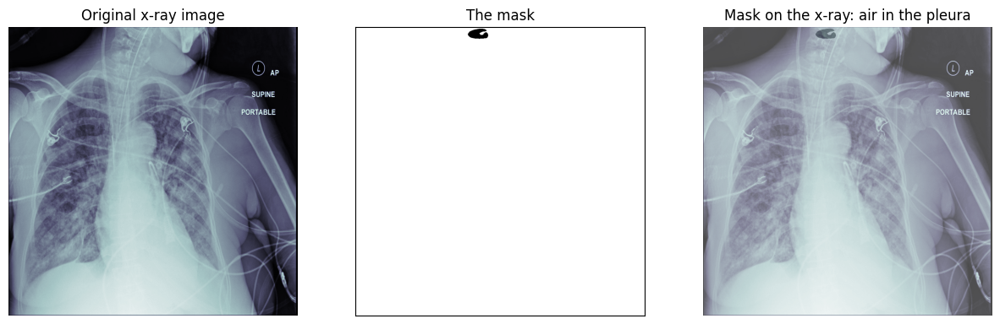

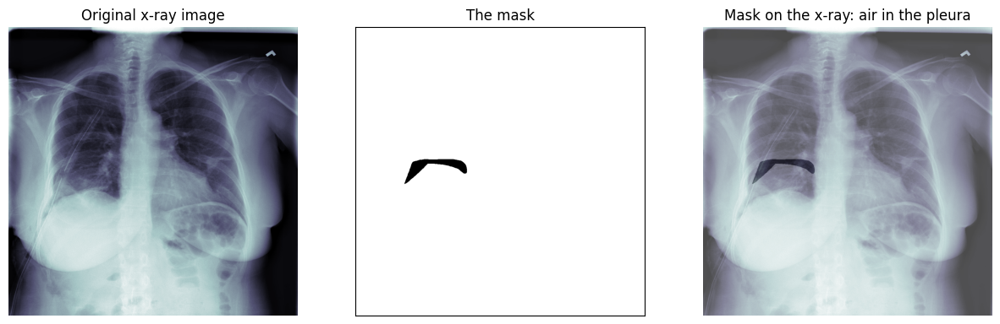

In [29]:
df_pneumo = df_patients[df_patients[" EncodedPixels"] != ' -1']

#print(df_pneumo.values[3][2], df_pneumo.values[3][3])

mask = rle2mask(train_rle.values[3][1], 1024, 1024)
mask = np.rot90(mask, 3) #rotating three times 90 to the right place
mask = np.flip(mask, axis=1)
img = pydicom.read_file(train[3]).pixel_array

fig = plt.figure(figsize=(15, 10))
a = fig.add_subplot(1, 3, 1)
plt.imshow(img, cmap='bone') #original x-ray
a.set_title("Original x-ray image")
plt.grid(False)
plt.axis("off")

a = fig.add_subplot(1, 3, 2)
imgplot = plt.imshow(mask, cmap='binary')

a.set_title("The mask")
plt.grid(False)
plt.xticks([])
plt.yticks([])

a = fig.add_subplot(1, 3, 3)
plt.imshow(img, cmap='bone')
plt.imshow(mask, cmap='binary', alpha=0.3)
a.set_title("Mask on the x-ray: air in the pleura")

plt.axis("off")

plt.grid(False)

mask = rle2mask(train_rle.values[6][1], 1024, 1024)
mask = np.rot90(mask, 3) #rotating three times 90 to the right place
mask = np.flip(mask, axis=1)
img = pydicom.read_file(train[6]).pixel_array

fig = plt.figure(figsize=(15, 10))
a = fig.add_subplot(1, 3, 1)
plt.imshow(img, cmap='bone') #original x-ray
a.set_title("Original x-ray image")
plt.grid(False)
plt.axis("off")

a = fig.add_subplot(1, 3, 2)
imgplot = plt.imshow(mask, cmap='binary')

a.set_title("The mask")
plt.grid(False)
plt.xticks([])
plt.yticks([])

a = fig.add_subplot(1, 3, 3)
plt.imshow(img, cmap='bone')
plt.imshow(mask, cmap='binary', alpha=0.3)
a.set_title("Mask on the x-ray: air in the pleura")

plt.axis("off")

plt.grid(False)

# Data exportation and masking

In [30]:
debug = False
# debug = True
ROOT_DIR = '/kaggle/working'
!ls ../input/

siim-acr-pneumothorax-segmentation-data


In [31]:
DATA_DIR = "/kaggle/input/siim-acr-pneumothorax-segmentation-data/pneumothorax"

In [32]:
!ls $DATA_DIR

dicom-images-test  dicom-images-train  train-rle.csv


# Data Processing

### Data Processing for Pneumothorax Detection

In [33]:
%%writefile /kaggle/working/data_processing.py

import numpy as np
import glob
import pydicom
import csv
import gzip
import cv2

def collect_and_process_pneumothorax_data(training_path, metadata_path, output_csv_path, output_npy_path, is_training=True):
    def initialize_csv_writer(header):
        csv_file = open(output_csv_path, mode='a', newline='')
        writer = csv.writer(csv_file, delimiter=',', quotechar='"')
        writer.writerow(header)
        return writer, csv_file

    def append_to_csv(record, csv_file, writer):
        writer.writerow(record)
        csv_file.flush()

    csv_header = ['ImageId', 'PatientId', 'PatientAge', 'PatientSex', 'ImageView']
    csv_writer, csv_file = initialize_csv_writer(csv_header)

    images = []

    for path_name in glob.glob(training_path + '/*/*/*.dcm'):
        this_img = pydicom.dcmread(path_name)
        image_array = this_img.pixel_array
        image_array = cv2.resize(image_array, (512, 512), interpolation=cv2.INTER_LINEAR)
        images.append(image_array)
        patient_id = this_img.PatientID
        sex = this_img.PatientSex
        age = this_img.PatientAge
        view = this_img.ViewPosition
        image_id = this_img.SOPInstanceUID

        this_record = [image_id, patient_id, age, sex, view]
        append_to_csv(record=this_record, csv_file=csv_file, writer=csv_writer)

    X_data = np.array(images)

    print('Number of total images:', len(X_data))
    print('Dataset shape:', X_data.shape)
    print('Dataset size:', X_data.nbytes)
    print('Export dataset as npy file? (y/n)\n')
    choice = input()

    if choice == 'y':
        # Specify the full path in the Kaggle working directory
        full_output_csv_path = '/kaggle/working/' + output_csv_path
        full_output_npy_path = '/kaggle/working/' + output_npy_path

        with gzip.GzipFile(filename=full_output_npy_path, mode='w') as file:
            np.save(file, arr=X_data)

        print('Compressed npy file saved in Kaggle working directory!')
    else:
        print('Saving dataset aborted!')


Writing /kaggle/working/data_processing.py


In [34]:
import data_processing

# Define the file paths and output paths
training_path = '/kaggle/input/siim-acr-pneumothorax-segmentation-data/pneumothorax/dicom-images-train'
metadata_path = '/kaggle/input/siim-acr-pneumothorax-segmentation-data/pneumothorax/train-rle.csv'
output_csv_path = 'converted-train-rle.csv'
output_npy_path = 'training_images.npy.gz'

# Call the function
data_processing.collect_and_process_pneumothorax_data(training_path, metadata_path, output_csv_path, output_npy_path)


Number of total images: 10712
Dataset shape: (10712, 512, 512)
Dataset size: 2808086528
Export dataset as npy file? (y/n)



 y


Compressed npy file saved in Kaggle working directory!


In [35]:
data = pd.read_csv("/kaggle/working/converted-train-rle.csv")
print(data)
del data 

                                                 ImageId  \
0      1.2.276.0.7230010.3.1.4.8323329.2057.151787517...   
1      1.2.276.0.7230010.3.1.4.8323329.11919.15178752...   
2      1.2.276.0.7230010.3.1.4.8323329.12935.15178752...   
3      1.2.276.0.7230010.3.1.4.8323329.14254.15178752...   
4      1.2.276.0.7230010.3.1.4.8323329.3796.151787517...   
...                                                  ...   
10707  1.2.276.0.7230010.3.1.4.8323329.14583.15178752...   
10708  1.2.276.0.7230010.3.1.4.8323329.5522.151787518...   
10709  1.2.276.0.7230010.3.1.4.8323329.12551.15178752...   
10710  1.2.276.0.7230010.3.1.4.8323329.427.1517875162...   
10711  1.2.276.0.7230010.3.1.4.8323329.4727.151787518...   

                                  PatientId  PatientAge PatientSex ImageView  
0      7ff6c916-ab77-46fa-8809-1e69c9a584dc          54          M        PA  
1      e73d148c-233f-4bc8-919b-1b2d224720bb          82          F        AP  
2      77966f08-8959-4a03-9041-ea23aaefc49

#### Loading Processed Pneumothorax Dataset

In [36]:
import os
print(os.listdir('/kaggle/working'))
import numpy as np
import gzip

# Load the dataset from the compressed .npy file in the Kaggle working directory
with gzip.GzipFile('/kaggle/working/training_images.npy.gz', 'r') as file:
    data = np.load(file)

# Check the shape and size of the dataset
print('Dataset shape:', data.shape)
print('Dataset size:', data.nbytes)


['data_processing.py', '__pycache__', 'converted-train-rle.csv', '.virtual_documents', 'training_images.npy.gz']
Dataset shape: (10712, 512, 512)
Dataset size: 2808086528


### Mask Generation from RLE Encoded Data

In [37]:
%%writefile /kaggle/working/mask_generation.py

import numpy as np
import operator
import csv
import gzip

# Function to convert RLE-encoded data into a binary mask
def rle2mask(rle, width=1024, height=1024):
    mask = np.zeros(width * height, dtype=np.uint8)
    array = np.asarray([int(x) for x in rle.split()])
    starts = array[0::2]
    lengths = array[1::2]

    current_position = 0
    for start, length in zip(starts, lengths):
        current_position += start
        mask[current_position:current_position + length] = 1
        current_position += length

    return np.rot90(np.flip(mask.reshape(width, height), axis=1))

# Function to generate masks from RLE-coded data and resize them
def generate_masks(metadata_path, mask_shape):
    metadata = open(metadata_path, mode='r')
    records = csv.reader(metadata, delimiter=',')
    sorted_records = sorted(records, key=operator.itemgetter(0))[:-1]  # Remove the last empty row

    masks = []
    current_mask = None
    for idx, rec in enumerate(sorted_records):
        image_id, encoded_pixel = rec[0], rec[1]
        if encoded_pixel == '-1':
            mask = np.zeros(mask_shape, dtype=np.uint8)
        else:
            mask = rle2mask(encoded_pixel, width=mask_shape[1], height=mask_shape[0])
        if idx > 0 and image_id != sorted_records[idx - 1][0]:
            if current_mask is not None:
                masks.append(current_mask)
            current_mask is mask
        else:
            current_mask = np.logical_or(current_mask, mask) if current_mask is not None else mask

    if current_mask is not None:
        masks.append(current_mask)

    return np.array(masks)

# Function to save the generated masks
def save_masks(masks, output_path):
    with gzip.GzipFile(output_path, 'w') as file:
        np.save(file, masks)
    print(f"Saved {len(masks)} masks to {output_path}")


Writing /kaggle/working/mask_generation.py


#### Generating and Saving Masks from RLE Encoded Data

In [38]:
# Import the functions from the module
from mask_generation import generate_masks, save_masks

# Define the paths and parameters
metadata_path = '/kaggle/input/siim-acr-pneumothorax-segmentation-data/pneumothorax/train-rle.csv'
mask_shape = (512, 512)
output_path = '/kaggle/working/training_masks_resized.npy.gz'

# Use the functions to generate masks and save them
generated_masks = generate_masks(metadata_path, mask_shape)
save_masks(generated_masks, output_path)

Saved 10675 masks to /kaggle/working/training_masks_resized.npy.gz


##### Loading Compressed Image Data

In [39]:
image_file_path = '/kaggle/working/training_images.npy.gz'

# Load the compressed images
with gzip.GzipFile(image_file_path, 'r') as file:
    original_images = np.load(file)


## Resampling Images to a Target Resolution

In [40]:
from PIL import Image

# Define the target resolution (e.g., 256x256)
target_resolution = (256, 256)

# Initialize an array to store the resampled images
resampled_images = []

# Resample each original image and store it
for image in original_images:
    pil_image = Image.fromarray(image)
    resized_image = pil_image.resize(target_resolution, Image.LANCZOS)
    resampled_image = np.array(resized_image)
    resampled_images.append(resampled_image)

# Convert the list of resampled images to a NumPy array
resampled_images = np.array(resampled_images)


### Loading Compressed Mask Data with Timing

In [41]:
# Define the path to the compressed image file
mask_file_path = '/kaggle/working/training_masks_resized.npy.gz'

# Load the compressed images
with gzip.GzipFile(mask_file_path, 'r') as file:
    %time original_masks = np.load(file)

CPU times: user 3.18 s, sys: 505 ms, total: 3.69 s
Wall time: 3.69 s


### Resampling Masks to a Target Resolution

In [42]:
# Define the target resolution (e.g., 256x256)
target_resolution = (256, 256)

# Initialize an array to store the resampled masks
resampled_masks = []

# Resample each original mask and store it
for mask in original_masks:
    pil_image = Image.fromarray(mask)
    resized_mask = pil_image.resize(target_resolution)
    resampled_mask = np.array(resized_mask)
    resampled_masks.append(resampled_mask)

# Convert the list of resampled masks to a NumPy array
resampled_masks = np.array(resampled_masks)


#### Visualizing Original and Resampled Images

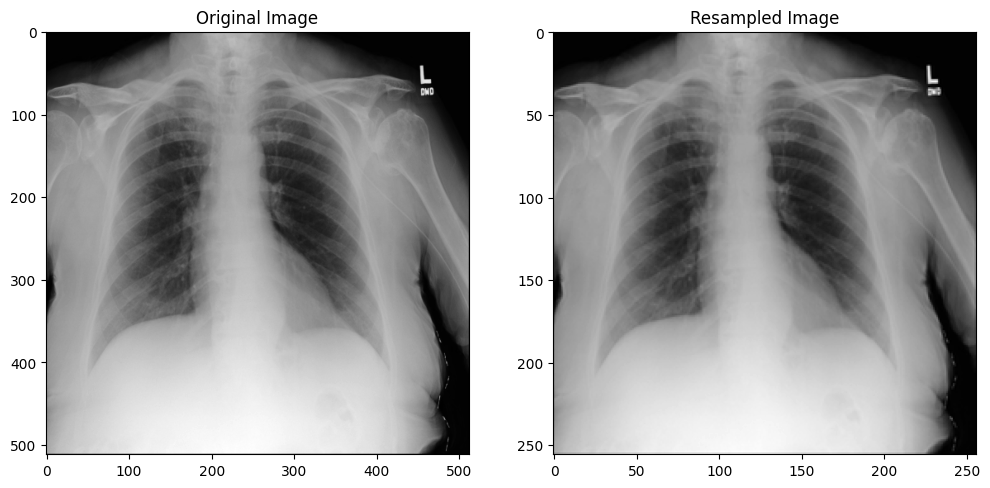

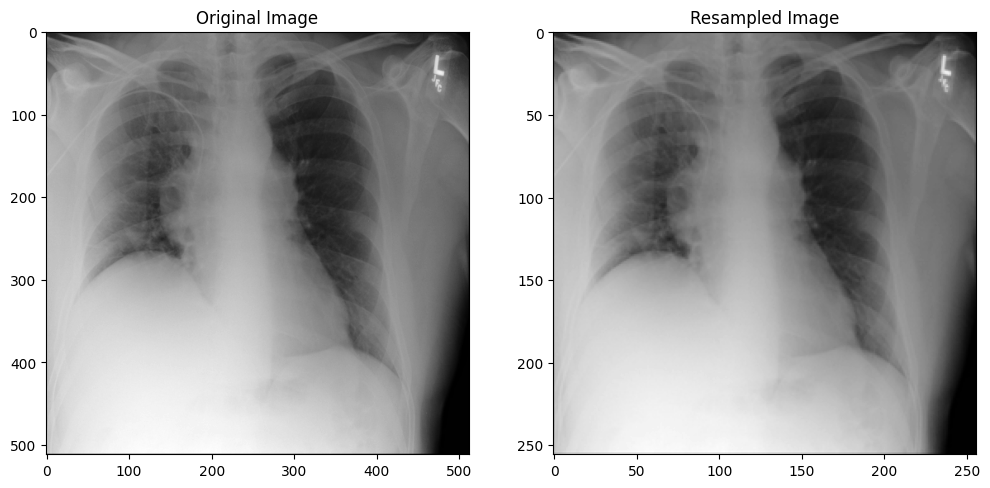

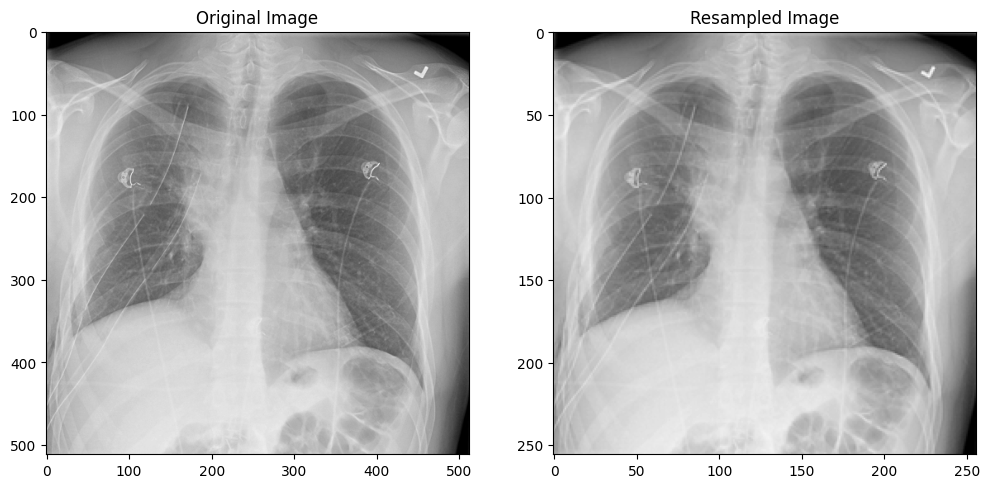

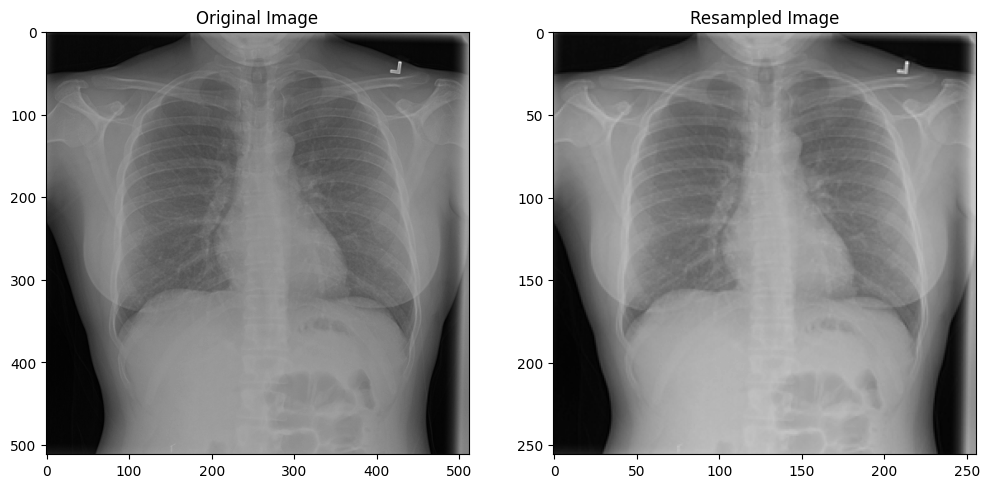

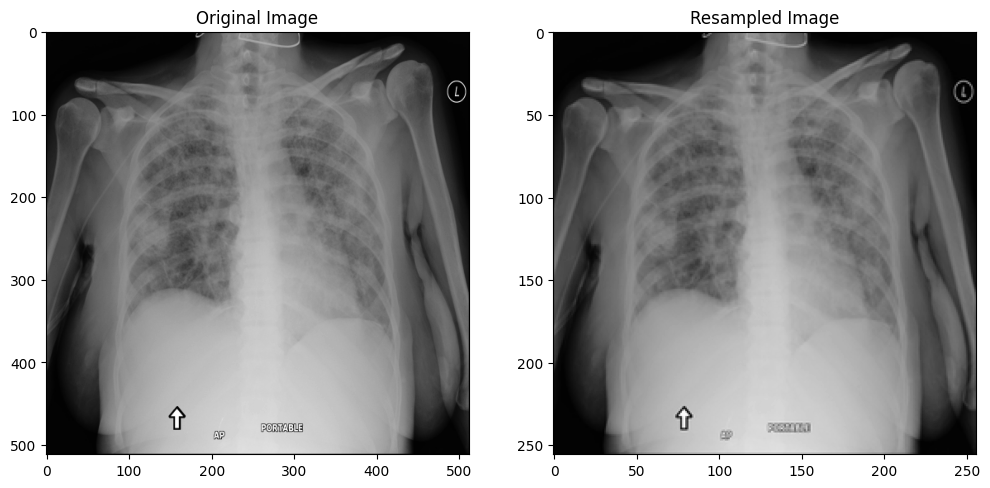

In [43]:
import matplotlib.pyplot as plt

# Define the number of samples to visualize
num_samples = 5  # You can change this number

# Generate random indices for samples
sample_indices = np.random.choice(len(original_images), num_samples, replace=False)

# Loop through and display the samples
for idx in sample_indices:
    original_image = original_images[idx]
    resampled_image = resampled_images[idx]

    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(original_image, cmap='gray')

    # Resampled Image
    plt.subplot(1, 2, 2)
    plt.title('Resampled Image')
    plt.imshow(resampled_image, cmap='gray')

    plt.show()


### Enhancing Image Contrast

In [44]:
from PIL import Image, ImageEnhance
import numpy as np

# Define the contrast enhancement factor (1.0 is the original image with no enhancement)
contrast_factor = 1.5  # Adjust this value as needed

# Initialize a list to store adjusted images
adjusted_images = []

# Apply contrast adjustment to each image
for image in resampled_images:
    # Ensure the image dtype is uint8 and in the range [0, 255]
    image = np.uint8(np.clip(image, 0, 255))
    pil_image = Image.fromarray(image)
    enhancer = ImageEnhance.Contrast(pil_image)
    adjusted_image = enhancer.enhance(contrast_factor)
    adjusted_images.append(np.array(adjusted_image))

# Convert the list of adjusted images to a NumPy array
adjusted_images = np.array(adjusted_images)


### Image Enhancement with Contrast Limited Adaptive Histogram Equalization (CLAHE)

In [45]:
adjusted_images = np.array([cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8)).apply(image) for image in adjusted_images])
print('applied CLAHE(Contrast Limited Adaptive Histogram Equalization) on images!')

#adjusted_images = np.array([np.concatenate((image, image, image), axis=-1) for image in adjusted_images])
#print('concatenated images to increase channels from 1 to 3!')

applied CLAHE(Contrast Limited Adaptive Histogram Equalization) on images!


### Visualizing Original and Adjusted Images

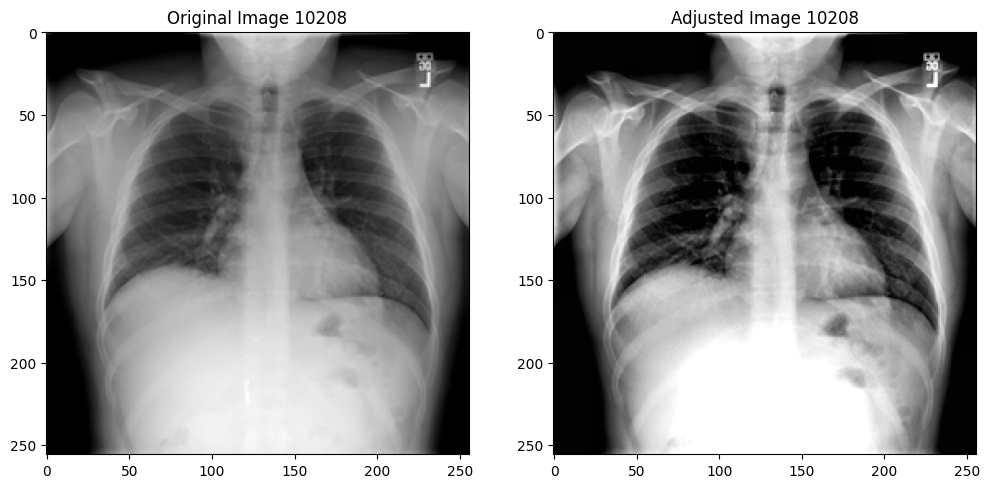

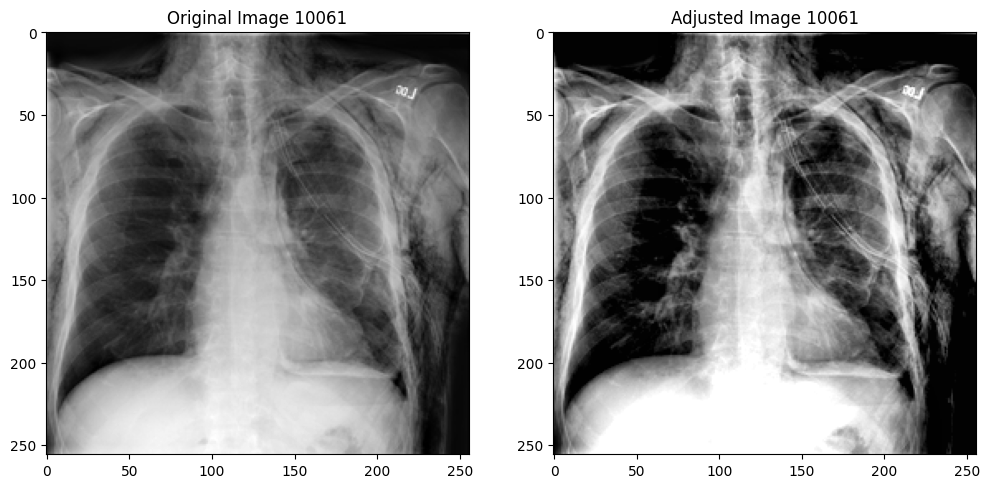

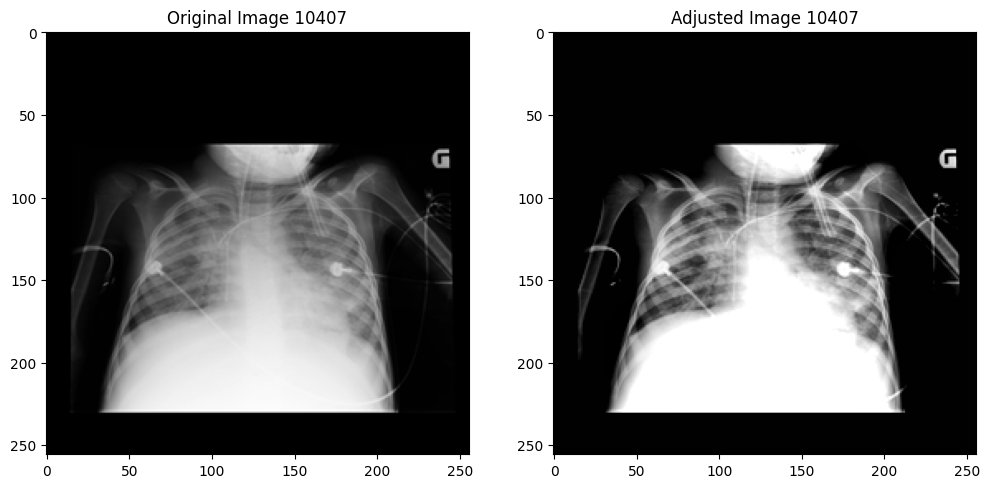

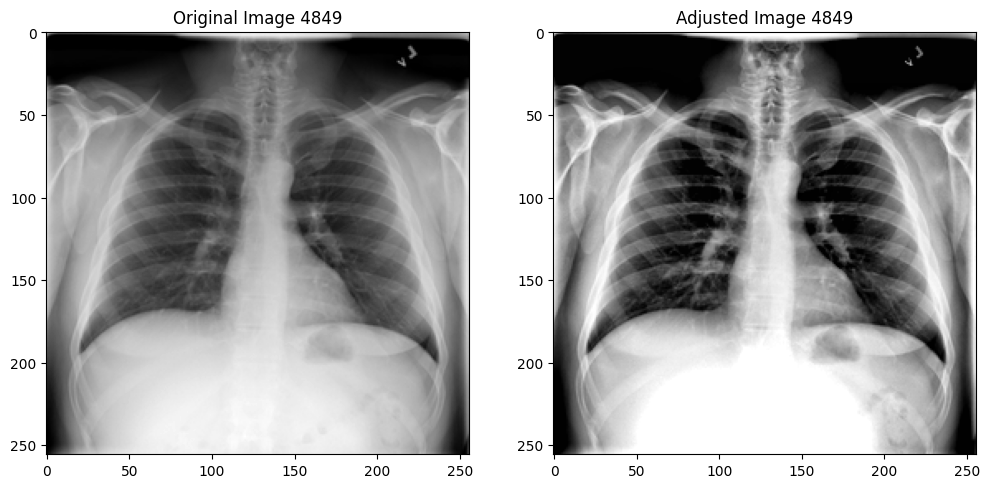

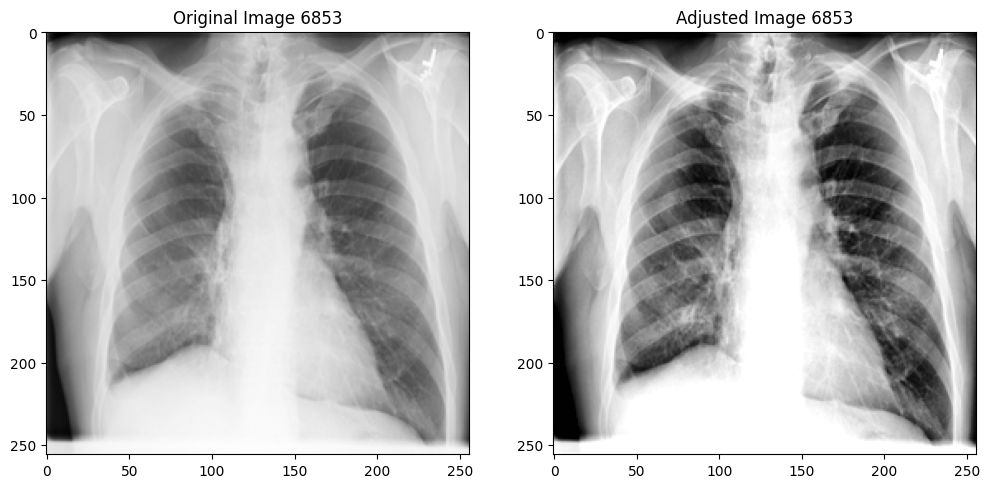

In [46]:
import matplotlib.pyplot as plt

# Define the number of samples to visualize
num_samples = 5  # You can change this number

# Generate random indices for samples
sample_indices = np.random.choice(len(adjusted_images), num_samples, replace=False)

# Loop through and display the samples
for idx in sample_indices:
    original_image = resampled_images[idx]
    adjusted_image = adjusted_images[idx]

    plt.figure(figsize=(12, 6))

    # Original Image
    plt.subplot(1, 2, 1)
    plt.title(f'Original Image {idx}')
    plt.imshow(original_image, cmap='gray')

    # Adjusted Image
    plt.subplot(1, 2, 2)
    plt.title(f'Adjusted Image {idx}')
    plt.imshow(adjusted_image, cmap='gray')

    plt.show()


# Data Loading for Modelling

In [47]:
!pip install segmentation-models-pytorch
#!pip uninstall pytorch-lightning
#!pip uninstall pytorch-lightning-bolts
#!pip install pytorch-lightning
#!pip install pytorch-lightning-bolts


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.7/106.7 kB 5.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 45.6 MB/s eta 0:00:0000:01
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16427 sha256=cfb43a48ece3ce347d991e34cd19a13bc64068842edbbaa36b20dea629a5e2d5
  Stored in directory: /root/.cache/pip/wheels/03/3f/e9/911b1bc46869644912bda90a56bcf7b960f20b5187feea3baf
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60945 sha256=4e509b5f61eb4b5c232a9f06ae38329ccfb892cd01f02e777a92ca31b034aa77
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-pytorch pretrainedmodels
  Attempting uninstall: timm
    Found existing instal

loading data 

In [48]:
metadata = pd.read_csv("/kaggle/working/converted-train-rle.csv")
print('metadata columns:', metadata.columns)
print('shape of the dataset:', adjusted_images.shape)
print('shape of the masks:', resampled_masks.shape)

metadata columns: Index(['ImageId', 'PatientId', 'PatientAge', 'PatientSex', 'ImageView'], dtype='object')
shape of the dataset: (10712, 256, 256)
shape of the masks: (10675, 256, 256)


In [49]:
import numpy as np

# Check if there are extra images without masks
if len(adjusted_images) > len(resampled_masks):
    num_extra_images = len(adjusted_images) - len(resampled_masks)
    adjusted_images = adjusted_images[:-num_extra_images]
    print(f"Removed {num_extra_images} extra images.")
elif len(adjusted_images) < len(resampled_masks):
    num_extra_masks = len(resampled_masks) - len(adjusted_images)
    resampled_masks = resampled_masks[:-num_extra_masks]
    print(f"Removed {num_extra_masks} extra masks.")
else:
    print("The number of images and masks match.")


Removed 37 extra images.


### Filtering Images with Pneumothorax

In [50]:
# only keep images with pneumothorax (if needed)
adjusted_images_with_pnx = list()
resampled_masks_with_pnx = list()
for adjusted_image, mask in zip(adjusted_images, resampled_masks):
    if np.max(mask) == 1:
        adjusted_images_with_pnx.append(adjusted_image)
        resampled_masks_with_pnx.append(mask)

adjusted_images = np.array(adjusted_images_with_pnx)
resampled_masks = np.array(resampled_masks_with_pnx)
del adjusted_images_with_pnx, resampled_masks_with_pnx

#### Visualizing Adjusted Images and Corresponding Masks

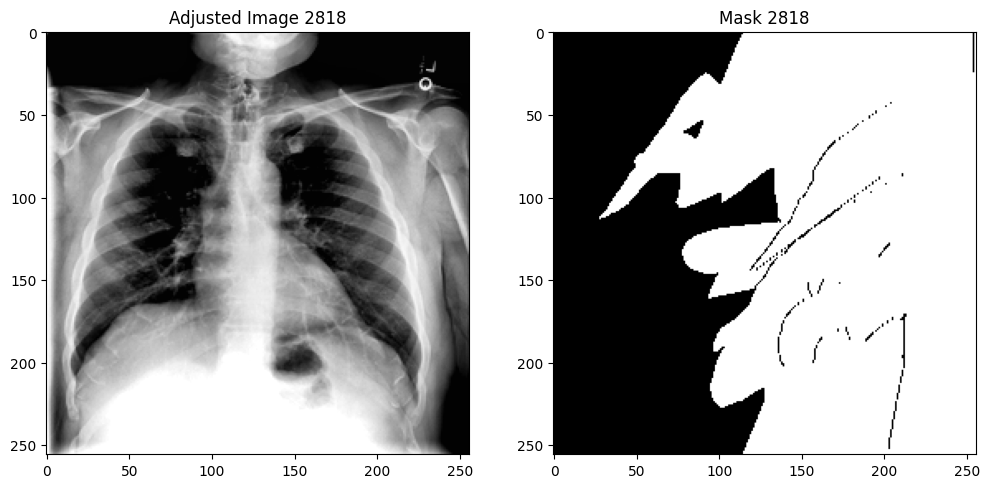

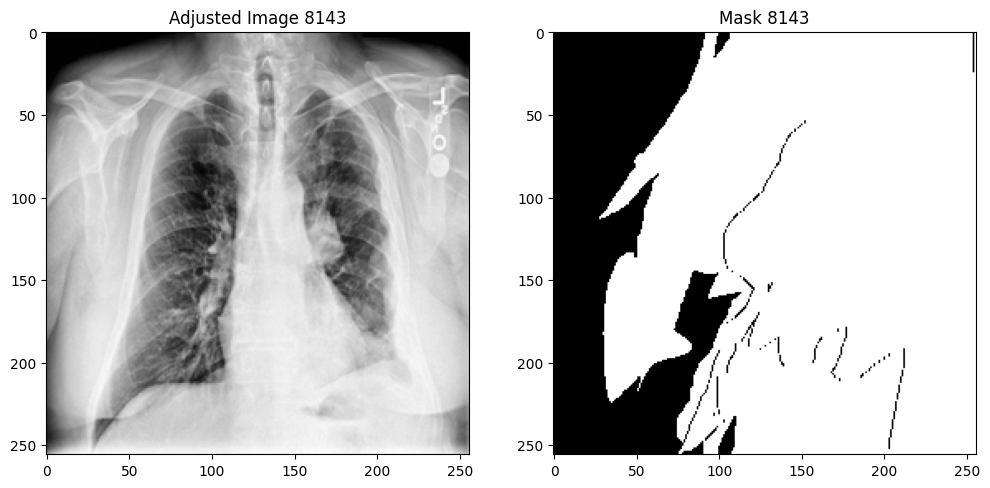

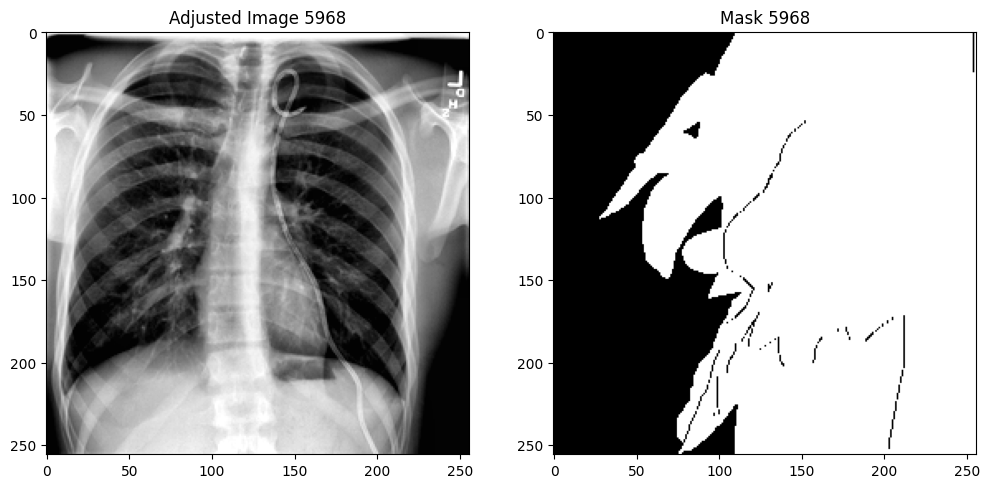

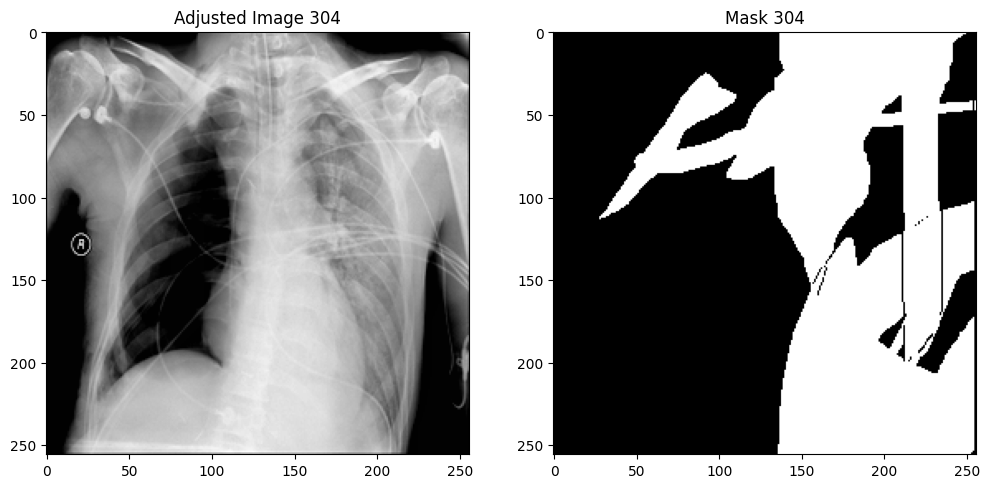

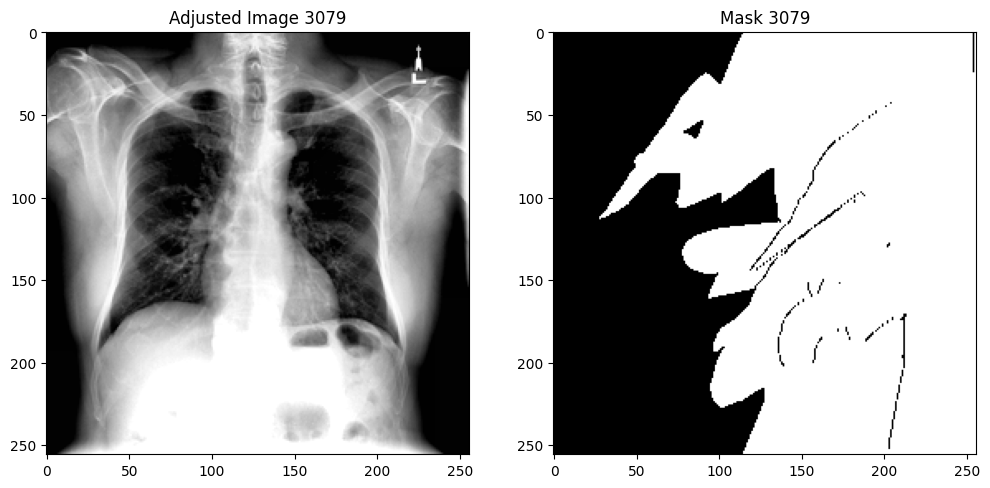

In [51]:
import matplotlib.pyplot as plt
import numpy as np

# Define the number of samples to visualize
num_samples = 5  # You can change this number

# Generate random indices for samples
sample_indices = np.random.choice(len(adjusted_images), num_samples, replace=False)

# Loop through and display the samples
for idx in sample_indices:
    adjusted_image = adjusted_images[idx]
    mask = resampled_masks[idx]

    plt.figure(figsize=(12, 6))

    # Adjusted Image
    plt.subplot(1, 2, 1)
    plt.title(f'Adjusted Image {idx}')
    plt.imshow(adjusted_image, cmap='gray')

    # Mask
    plt.subplot(1, 2, 2)
    plt.title(f'Mask {idx}')
    plt.imshow(mask, cmap='gray')

    plt.show()


#### Loading Libraries 

In [52]:
import torch
from torch.utils.data import Dataset, DataLoader
import segmentation_models_pytorch as smp #import segmentation models architechture 
from torchvision import transforms
from sklearn.model_selection import train_test_split
#from pl_bolts.datamodules import GridSearchData

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning:

A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5



#### Splitting the Training Dataset into Training and Validation Sets

In [53]:
X_train, X_val, y_train, y_val = train_test_split(adjusted_images, resampled_masks, test_size=0.1, random_state=10)
print('Splitted into training/validation sets!')
print(f"Train size: {len(X_train)}, y_train shape: {y_train.shape}")
print(f"Valid size: {len(X_val)}, y_val shape: {y_val.shape}")


Splitted into training/validation sets!
Train size: 9595, y_train shape: (9595, 256, 256)
Valid size: 1067, y_val shape: (1067, 256, 256)


### Creating Custom Datasets and Data Loaders for PyTorch

In [54]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np

class CustomDataset(Dataset):
    def __init__(self, images, masks):
        self.images = images
        self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]
        mask = self.masks[idx]

        # Assuming your images and masks are in NumPy arrays
        # Expand single-channel images to 3 channels
        image = np.stack((image, image, image), axis=0)
        image = torch.from_numpy(image).float()
        mask = torch.from_numpy(mask).float()

        return image, mask

# Assuming you have X_train, y_train, X_val, and y_val already defined

# Create custom datasets for training and validation
train_dataset = CustomDataset(X_train, y_train)
val_dataset = CustomDataset(X_val, y_val)

# Create data loaders for training and validation
batch_size = 32  # You can adjust the batch size
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False, num_workers=4)

#### Checking Data Shapes in PyTorch Data Loaders

In [55]:
import torch

# Assuming you have already defined your train_loader and val_loader

# Print shapes of images from the train_loader
print("Shapes of images in train_loader:")
for batch in train_loader:
    images, masks = batch
    print(images.shape)  # This will print the shape of the images in the batch
    break  # To print only the first batch

# Print shapes of images from the val_loader
print("\nShapes of images in val_loader:")
for batch in val_loader:
    images, masks = batch
    print(images.shape)  # This will print the shape of the images in the batch
    break  # To print only the first batch


Shapes of images in train_loader:
torch.Size([32, 3, 256, 256])

Shapes of images in val_loader:
torch.Size([32, 3, 256, 256])


# Pneumothorax Segmentation Model using PyTorch Lightning
1. Model Initialization
2. Forward Pass
3. Training, Validation, and Test Logic

In [56]:
import pytorch_lightning as pl
import torch
import segmentation_models_pytorch as smp

class PneumothoraxModel(pl.LightningModule):
    def __init__(self, arch, encoder_name, in_channels, out_classes, **kwargs):
        super().__init__()
        self.model = smp.create_model(arch, encoder_name=encoder_name, in_channels=in_channels, classes=out_classes, **kwargs)

        # Preprocessing parameters for image
        params = smp.encoders.get_preprocessing_params(encoder_name)
        self.register_buffer("std", torch.tensor(params["std"]).view(1, 3, 1, 1))
        self.register_buffer("mean", torch.tensor(params["mean"]).view(1, 3, 1, 1))

        # Loss function
        self.loss_fn = smp.losses.DiceLoss("binary", from_logits=True)  # Use "binary" mode for binary segmentation

    def forward(self, image):
        # Normalize the image
        image = (image - self.mean) / self.std
        mask = self.model(image)
        return mask

    def training_step(self, batch, batch_idx):
        image, mask = batch
        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)
        return loss

    def validation_step(self, batch, batch_idx):
        image, mask = batch
        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)
        return loss

    def test_step(self, batch, batch_idx):
        image, mask = batch
        logits_mask = self.forward(image)
        loss = self.loss_fn(logits_mask, mask)
        return loss

    def configure_optimizers(self):
        return torch.optim.Adam(self.parameters(), lr=0.0001)

# Create an instance of the model
model = PneumothoraxModel("unet", "resnet34", in_channels=3, out_classes=1)


### Create an instance of the PneumothoraxModel
* Model architecture: UNet
* Encoder: ResNet34
* Input channels: 3 (assuming RGB images)
* Output classes: 1 (binary segmentation, likely for pneumothorax detection)

In [57]:
model = PneumothoraxModel("unet", "resnet34", in_channels=3, out_classes=1)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 275MB/s]


## PyTorch Lightning Trainer Configuration and Model Training

In [62]:
#torch.multiprocessing.set_start_method('spawn')# good solution !!!!
trainer = pl.Trainer(
    accelerator="auto", 
    max_epochs=10,
)

trainer.fit(
    model, 
    train_dataloaders=train_loader, 
    val_dataloaders=val_loader,
)

Sanity Checking: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

Validation: 0it [00:00, ?it/s]

In [74]:
torch.save(model.state_dict(), "/kaggle/working/pneumothorax_unet_resnet34.pth")

## Model Evaluation

### Model Evaluation Using Dice Coefficient, IOU and F1- Score 

In [65]:
import torch
import numpy as np
from sklearn.metrics import f1_score
from sklearn.metrics import jaccard_score

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define a function to calculate Dice coefficient
def dice_coefficient(predicted, target, epsilon=1e-5):
    intersection = torch.sum(predicted * target)
    union = torch.sum(predicted) + torch.sum(target)
    return (2.0 * intersection + epsilon) / (union + epsilon)

# Initialize lists to store evaluation metrics
dice_scores = []
iou_scores = []
f1_scores = []

# Set the model to evaluation mode
model.eval()

# Move the model to the same device as the data
model.to(device)

# Loop through the validation data
with torch.no_grad():
    for images, masks in val_loader:
        images, masks = images.to(device), masks.to(device)

        # Forward pass to get predicted masks
        predicted_masks = model(images)

        # Threshold the predicted masks (assuming binary segmentation)
        predicted_masks = (predicted_masks > 0.5).float()

        # Calculate evaluation metrics for each batch
        for i in range(len(predicted_masks)):
            dice = dice_coefficient(predicted_masks[i], masks[i])
            dice_scores.append(dice.item())

            iou = jaccard_score(masks[i].view(-1).cpu().numpy(), predicted_masks[i].view(-1).cpu().numpy())
            iou_scores.append(iou)

            f1 = f1_score(masks[i].view(-1).cpu().numpy(), predicted_masks[i].view(-1).cpu().numpy())
            f1_scores.append(f1)

# Calculate the mean of evaluation metrics
mean_dice = np.mean(dice_scores)
mean_iou = np.mean(iou_scores)
mean_f1 = np.mean(f1_scores)

print(f"Mean Dice Coefficient: {mean_dice:.4f}")
print(f"Mean IoU: {mean_iou:.4f}")
print(f"Mean F1 Score: {mean_f1:.4f}")


Mean Dice Coefficient: 0.9303
Mean IoU: 0.8756
Mean F1 Score: 0.9303


## Model Interpretablity 

### Tensorboard Visulisation

In [66]:
!pip install tensorboard
import tensorboard

# Start Kaggle's integrated TensorBoard
tensorboard.notebook.start("--logdir /kaggle/working/lightning_logs")



In [68]:
from pytorch_lightning.loggers import TensorBoardLogger

logger = TensorBoardLogger(save_dir="/kaggle/working/lightning_logs", name="pneumothorax")


In [69]:
logger

 ### GRAD_CAM Visusalisation
1.  Define the Grad-CAM class
2.  Define a function to visualize the Grad-CAM
3.  Use the Grad-CAM to visualize the results for a specific image

In [70]:
from torch.autograd import Function
class GradCam:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.model.eval()
        self.feature_maps = None
        self.gradient = None

    def register_hooks(self):
        def forward_hook(module, input, output):
            self.feature_maps = output

        def backward_hook(module, grad_input, grad_output):
            self.gradient = grad_output[0]

        target_layer = self.model.get_layer(self.target_layer)
        target_layer.register_forward_hook(forward_hook)
        target_layer.register_backward_hook(backward_hook)

    def forward(self, x):
        return self.model(x)

    def backward(self, logits, target_class):
        self.model.zero_grad()
        one_hot_output = torch.FloatTensor(1, logits.size()[-1]).zero_()
        one_hot_output[0][target_class] = 1
        logits.backward(gradient=one_hot_output)

    def generate(self, x, target_class):
        self.register_hooks()
        logits = self.forward(x)
        self.backward(logits, target_class)
        weights = torch.mean(self.gradient, axis=(2, 3))
        cam = torch.matmul(self.feature_maps, weights.unsqueeze(2).unsqueeze(3))
        cam = cam[0, 0].detach().cpu().numpy()
        cam = np.maximum(cam, 0)
        cam = cam / cam.max()
        return cam


In [71]:
def visualize_grad_cam(input_image, cam, save_path=None):
    heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255
    cam_image = heatmap + input_image
    cam_image = cam_image / np.max(cam_image)

    plt.imshow(cam_image)
    plt.axis('off')
    if save_path:
        plt.savefig(save_path, bbox_inches='tight', pad_inches=0, dpi=300)
    plt.show()


In [ ]:
# Choose an image and target class
image = test[0]  # Replace with the image you want to visualize
target_class = 0  # Replace with the target class (0 or 1)

# Create a GradCam instance
grad_cam = GradCam(model, target_layer="encoder.layer4")  # Replace with your target layer

# Generate the Grad-CAM
cam = grad_cam.generate(image, target_class)

# Visualize the Grad-CAM
visualize_grad_cam(image, cam)

In [73]:
model_layers = list(model.children())
model_layers

[Unet(
   (encoder): ResNetEncoder(
     (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
     (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
     (relu): ReLU(inplace=True)
     (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
     (layer1): Sequential(
       (0): BasicBlock(
         (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         (relu): ReLU(inplace=True)
         (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
       )
       (1): BasicBlock(
         (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
         (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, a